In [1]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster import hierarchy
from sklearn.preprocessing import normalize
from sklearn.preprocessing import scale
import numpy as np
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
import seaborn as sns

In [3]:
df=pd.read_csv('online_shoppers_intention.csv')

In [4]:
df.Weekend=df.Weekend.astype(int)
df.Revenue=df.Revenue.astype(int)
df["VisitorType"]=df["VisitorType"].transform(lambda x: 1 if x=="Returning_Visitor" else (0 if x=="New_Visitor" else -1))
month_dict={'Jan': 1,
 'Feb': 2,
 'Mar': 3,
 'Apr': 4,
 'May': 5,
 'June': 6,
 'Jul': 7,
 'Aug': 8,
 'Sep': 9,
 'Oct': 10,
 'Nov': 11,
 'Dec': 12}
df["Month"]=df["Month"].map(month_dict)
data=df
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,1,1,1,1,1,0,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,2,2,2,1,2,1,0,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,4,1,9,3,1,0,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,2,3,2,2,4,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,2,3,3,1,4,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,12,4,6,1,1,1,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,11,3,2,1,8,1,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,11,3,2,1,13,1,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,11,2,2,3,11,1,0,0


In [5]:
scaled_df=scale(df)
scaled_df=pd.DataFrame(scaled_df)
scaled_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,-0.308821,-1.665924,-1.233426,-0.790293,-0.894178,-0.762629,0.401025,-0.550552,-0.427872
1,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903,-0.457683,1.171473,-0.317178,-0.308821,-1.665924,-0.136078,-0.207952,-0.894178,-0.514182,0.401025,-0.550552,-0.427872
2,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,-0.308821,-1.665924,2.058618,-0.790293,2.437081,-0.265735,0.401025,-0.550552,-0.427872
3,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954,0.573535,1.994610,-0.317178,-0.308821,-1.665924,0.961270,-0.207952,-0.477771,-0.017289,0.401025,-0.550552,-0.427872
4,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430,-0.045196,0.142551,-0.317178,-0.308821,-1.665924,0.961270,0.374389,-0.894178,-0.017289,0.401025,1.816360,-0.427872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,0.206173,0.363075,-0.396478,-0.244931,0.478227,0.307822,-0.310366,-0.288966,0.342125,-0.308821,1.281578,2.058618,2.121412,-0.894178,-0.762629,0.401025,1.816360,-0.427872
12326,-0.696993,-0.457191,-0.396478,-0.244931,-0.601062,-0.380957,-0.457683,-0.447364,-0.317178,-0.308821,0.986828,0.961270,-0.207952,-0.894178,0.976499,0.401025,1.816360,-0.427872
12327,-0.696993,-0.457191,-0.396478,-0.244931,-0.578577,-0.528063,1.261014,0.897093,-0.317178,-0.308821,0.986828,0.961270,-0.207952,-0.894178,2.218733,0.401025,1.816360,-0.427872
12328,0.507228,-0.032916,-0.396478,-0.244931,-0.376210,-0.443536,-0.457683,-0.453140,-0.317178,-0.308821,0.986828,-0.136078,-0.207952,-0.061364,1.721839,0.401025,-0.550552,-0.427872


In [6]:
normalized_df=normalize(df)
normalized_df=pd.DataFrame(normalized_df)
normalized_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.000000,0.000000,0.0,0.0,0.314970,0.000000,0.062994,0.062994,0.000000,0.0,0.629941,0.314970,0.314970,0.314970,0.314970,0.314970,0.000000,0.0
1,0.000000,0.000000,0.0,0.0,0.031166,0.997324,0.000000,0.001558,0.000000,0.0,0.031166,0.031166,0.031166,0.015583,0.031166,0.015583,0.000000,0.0
2,0.000000,0.000000,0.0,0.0,0.094039,0.000000,0.018808,0.018808,0.000000,0.0,0.188078,0.376155,0.094039,0.846349,0.282116,0.094039,0.000000,0.0
3,0.000000,0.000000,0.0,0.0,0.285327,0.380436,0.007133,0.019973,0.000000,0.0,0.285327,0.427990,0.285327,0.285327,0.570653,0.142663,0.000000,0.0
4,0.000000,0.000000,0.0,0.0,0.015933,0.999821,0.000032,0.000080,0.000000,0.0,0.003187,0.004780,0.004780,0.001593,0.006373,0.001593,0.001593,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,0.001675,0.080980,0.0,0.0,0.029600,0.996220,0.000004,0.000016,0.006837,0.0,0.006702,0.002234,0.003351,0.000558,0.000558,0.000558,0.000558,0.0
12326,0.000000,0.000000,0.0,0.0,0.010730,0.999479,0.000000,0.000046,0.000000,0.0,0.023606,0.006438,0.004292,0.002146,0.017168,0.002146,0.002146,0.0
12327,0.000000,0.000000,0.0,0.0,0.032402,0.995000,0.000450,0.000468,0.000000,0.0,0.059403,0.016201,0.010801,0.005400,0.070204,0.005400,0.005400,0.0
12328,0.011276,0.211421,0.0,0.0,0.042284,0.975356,0.000000,0.000059,0.000000,0.0,0.031008,0.005638,0.005638,0.008457,0.031008,0.002819,0.000000,0.0


### Metoda łokcia

In [7]:
# Code copied from laboratory file
from scipy.spatial import distance
def count_clustering_scores(X, cluster_num, model_class, score_fun):
    if isinstance(cluster_num, int):
        cluster_num_iter = [cluster_num]
    else:
        cluster_num_iter = cluster_num
    scores = []    
    for k in cluster_num_iter:
        model_instance = model_class(n_clusters=k)
        labels = model_instance.fit_predict(X)
        wcss = score_fun(X, labels)
        scores.append(wcss)
    
    if isinstance(cluster_num, int):
        return scores[0]
    else:
        return scores
def count_clustering_scores_agl(X, cluster_num, model_class, score_fun):
    if isinstance(cluster_num, int):
        cluster_num_iter = [cluster_num]
    else:
        cluster_num_iter = cluster_num
    scores = []    
    for k in cluster_num_iter:
        model_instance = model_class(n_clusters=k,linkage="ward")
        labels = model_instance.fit_predict(X)
        wcss = score_fun(X, labels)
        scores.append(wcss)
    
    if isinstance(cluster_num, int):
        return scores[0]
    else:
        return scores
def mean_dist_to_center(X, label):
    clusters = set(label)
    inclust_dist_list = []
    for cluster_i in clusters:
        cluster_i_idx = np.where(label == cluster_i)
        cluster_i_mean = np.mean(X[cluster_i_idx], axis=0, keepdims=True)
        inclust_dist = np.mean(distance.cdist(X[cluster_i_idx], cluster_i_mean))
        inclust_dist_list.append(inclust_dist)
    return np.mean(inclust_dist_list)

Za pomocą metody łokcia ciężko jest określić optymalną ilość klastrów może to być 2, 4, 6 lub 8. Dlatego spróbujemy metoda silhouette.

### Metoda silhouette

In [8]:
def plots(df):
    vec2=[]
    for cluster_amount in range(4,14):
        model=KMeans(n_clusters=cluster_amount)
        model.fit_predict(df)
        vec2.append(model.inertia_)
    plt.plot(range(4,14),vec2)
    plt.title("Elbow method")
    plt.show()
    vec1=(count_clustering_scores(np.array(df), range(4,15), KMeans, silhouette_score))
    plt.plot(range(4,15),vec1)
    plt.title("Silhouette")
    plt.show()

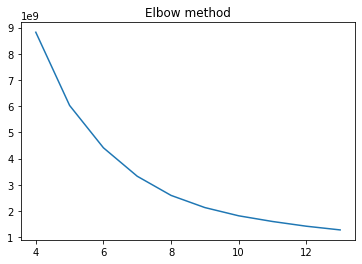

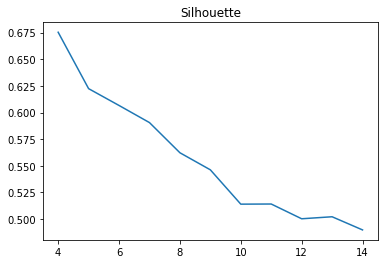

In [9]:
plots(df)


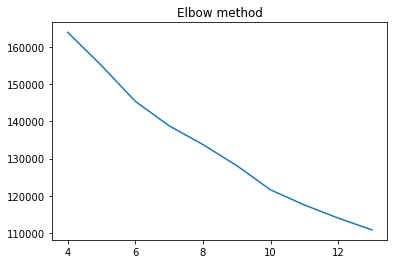

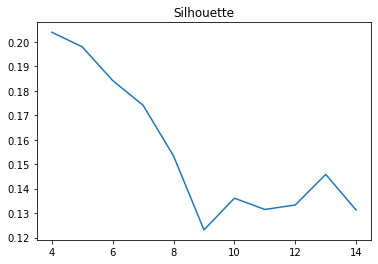

In [10]:
plots(scaled_df)

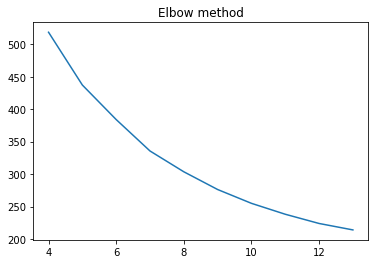

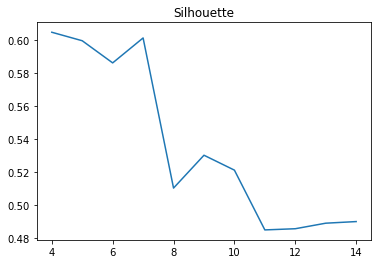

In [11]:
plots(normalized_df)

In [12]:
data=data.drop('Month',axis="columns").drop('VisitorType',axis="columns").drop('SpecialDay',axis="columns").drop('OperatingSystems',axis="columns").drop('Browser',axis="columns").drop('TrafficType',axis="columns").drop('Region',axis="columns")
scaled_dane=scale(data)
scaled_dane=pd.DataFrame(scaled_dane)
normalized_dane=normalize(data)
normalized_dane=pd.DataFrame(normalized_dane)

In [13]:
tsne=TSNE(n_components=2,n_iter_without_progress=50)
tsne_1=tsne.fit_transform(df)

In [15]:
tsne_1=pd.DataFrame(tsne_1)

,0,1
0,-54.775776,-6.907370
1,-18.054468,-84.749710
2,-51.261238,-20.730608
3,-56.915817,-12.540260
4,77.897499,1.989096


<AxesSubplot:xlabel='0', ylabel='1'>

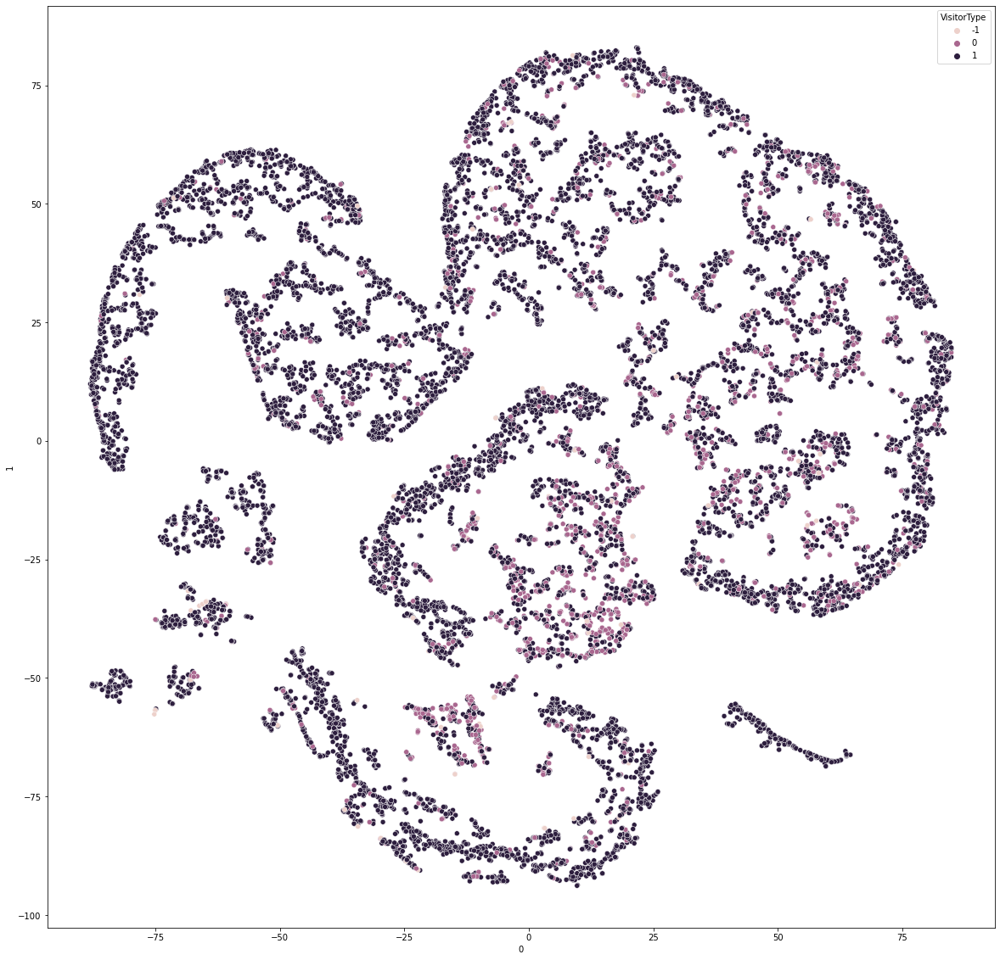

In [16]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_1[0],y=tsne_1[1],hue=df['VisitorType'])

<AxesSubplot:xlabel='0', ylabel='1'>

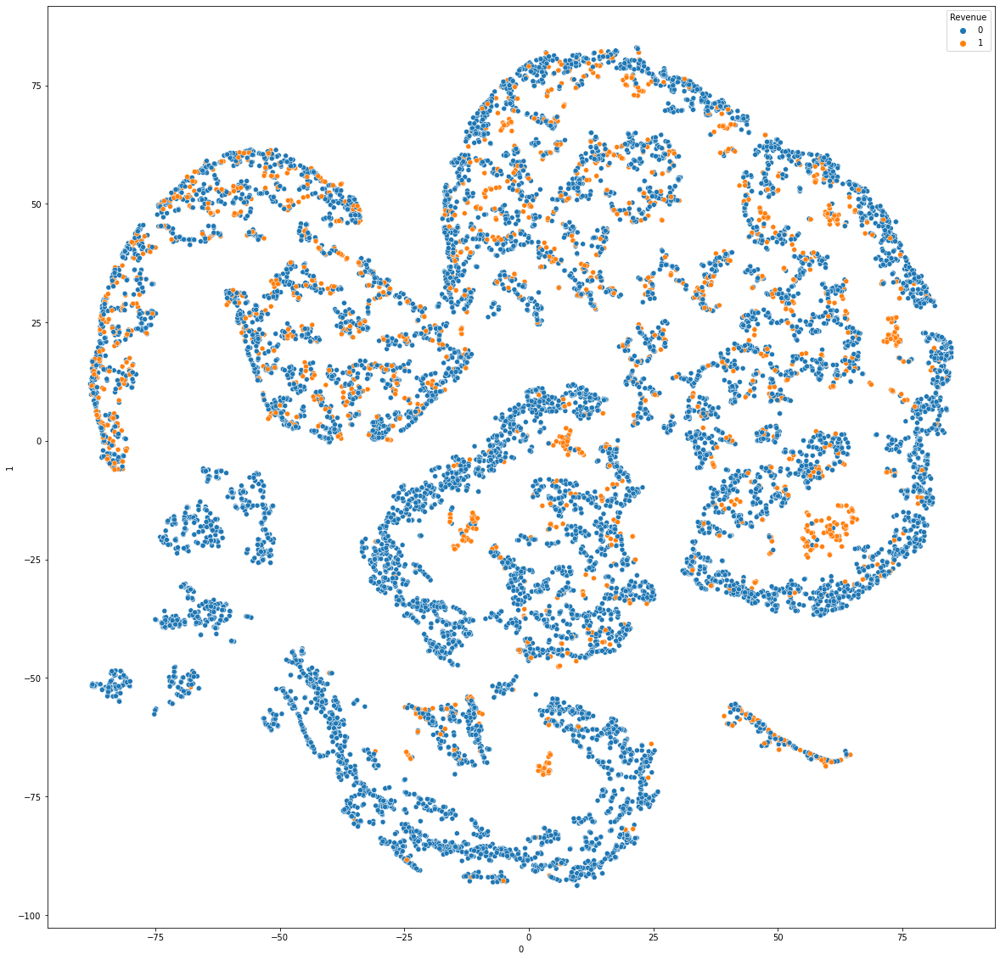

In [17]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_1[0],y=tsne_1[1],hue=df['Revenue'])

In [18]:

tsne_2=tsne.fit_transform(normalized_df)
tsne_2=pd.DataFrame(tsne_2)

<AxesSubplot:xlabel='0', ylabel='1'>

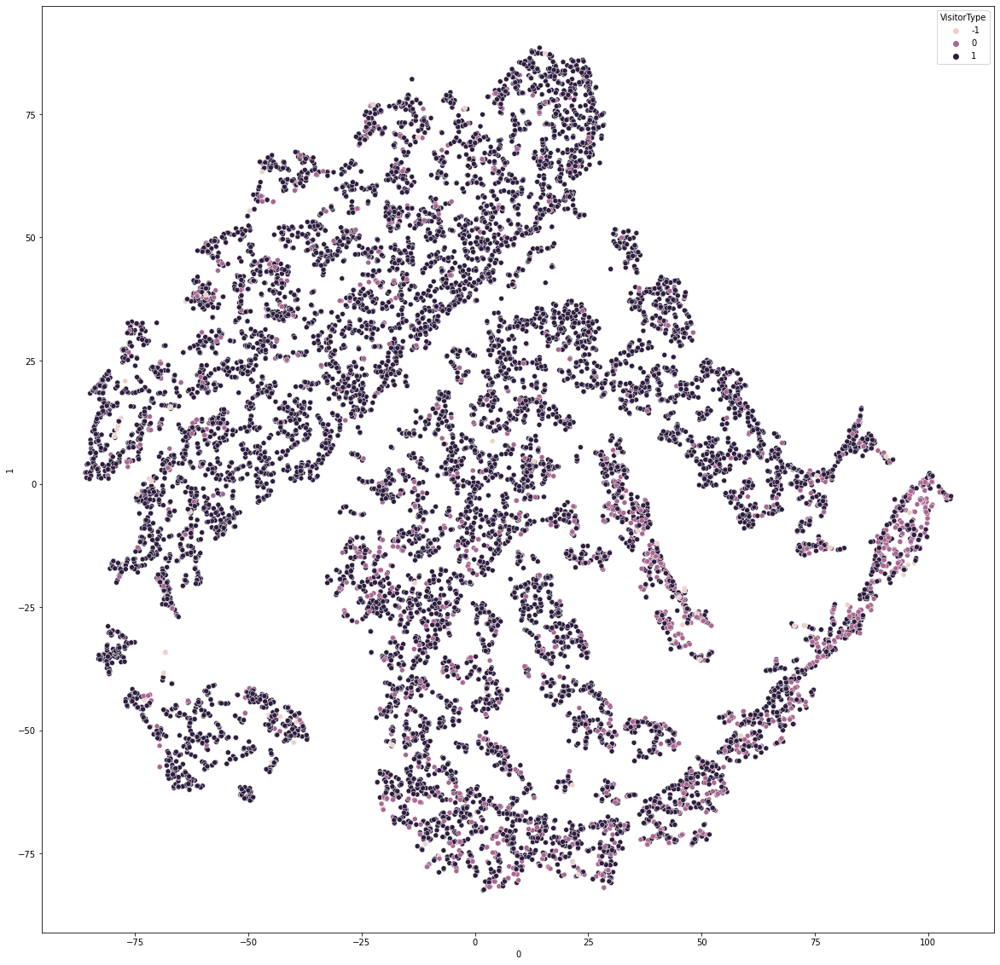

In [19]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_2[0],y=tsne_2[1],hue=df['VisitorType'])

<AxesSubplot:xlabel='0', ylabel='1'>

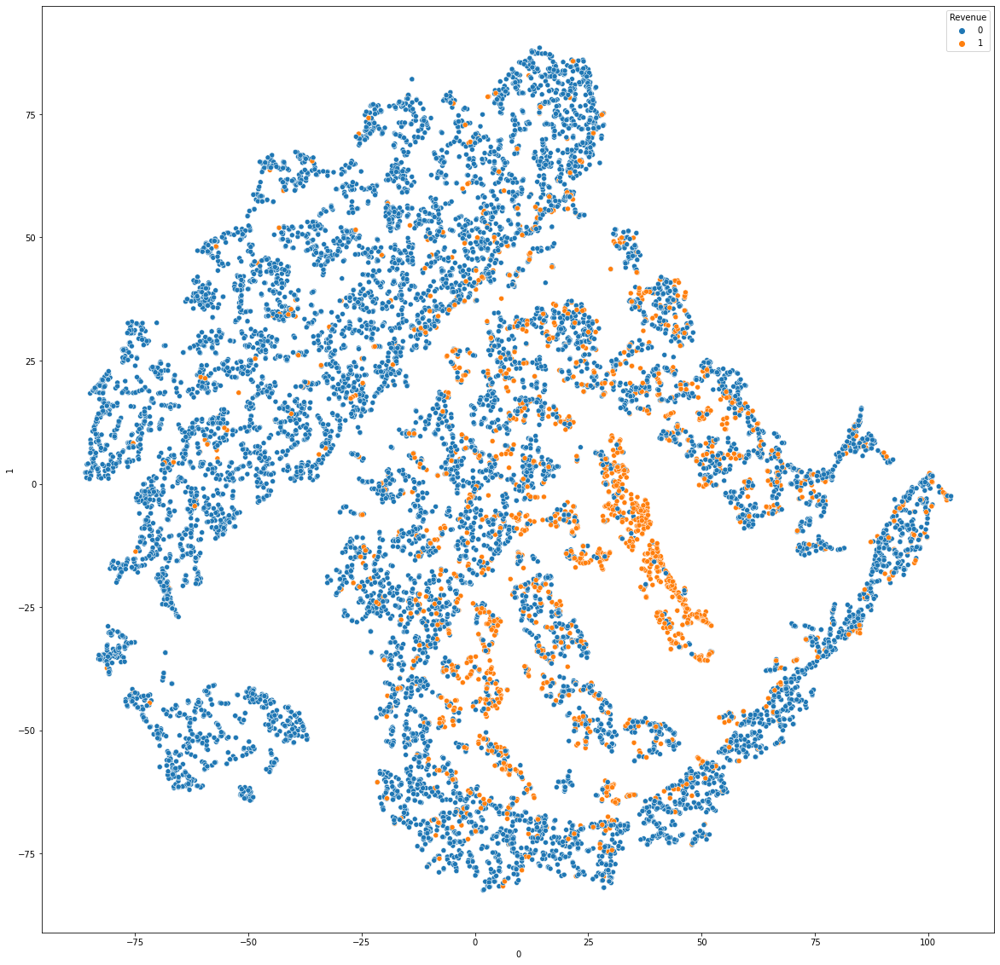

In [74]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_2[0],y=tsne_2[1],hue=df['Revenue'])

<AxesSubplot:xlabel='0', ylabel='1'>

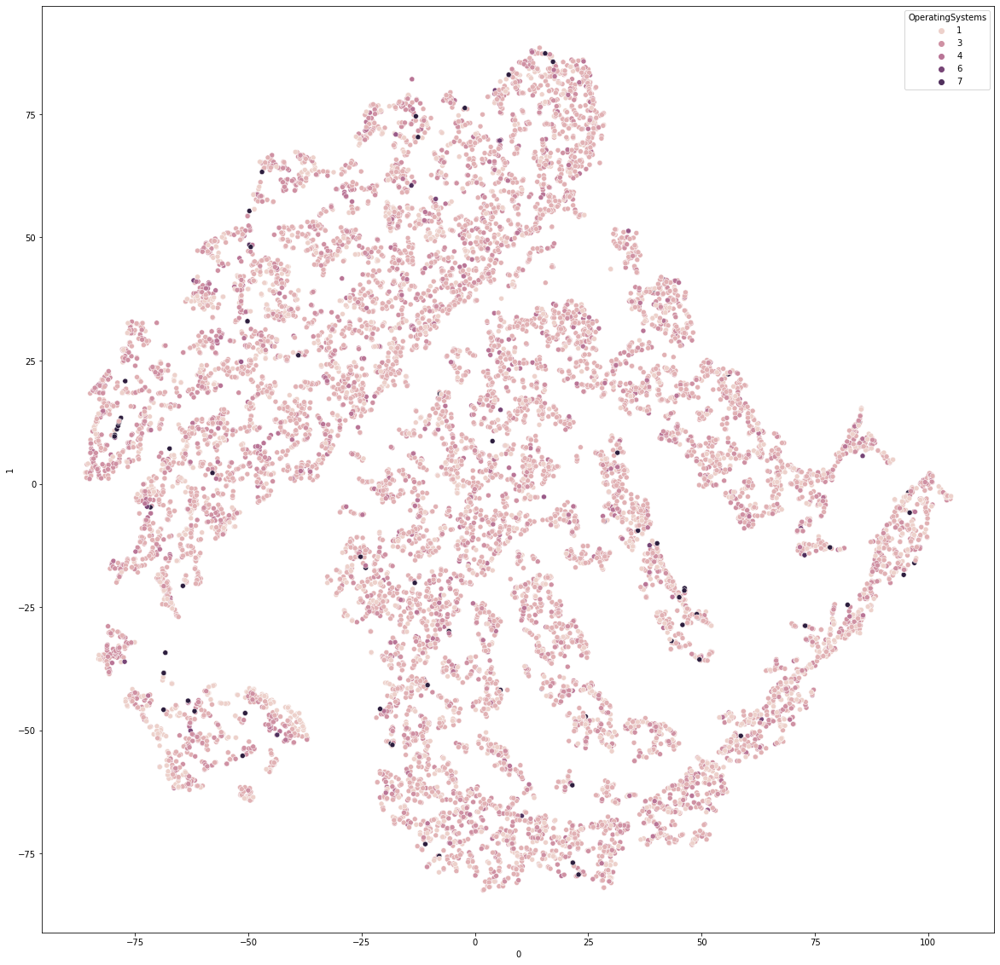

In [75]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_2[0],y=tsne_2[1],hue=df['OperatingSystems'])

In [20]:
tsne_3=tsne.fit_transform(scaled_df)
tsne_3=pd.DataFrame(tsne_3)

<AxesSubplot:xlabel='0', ylabel='1'>

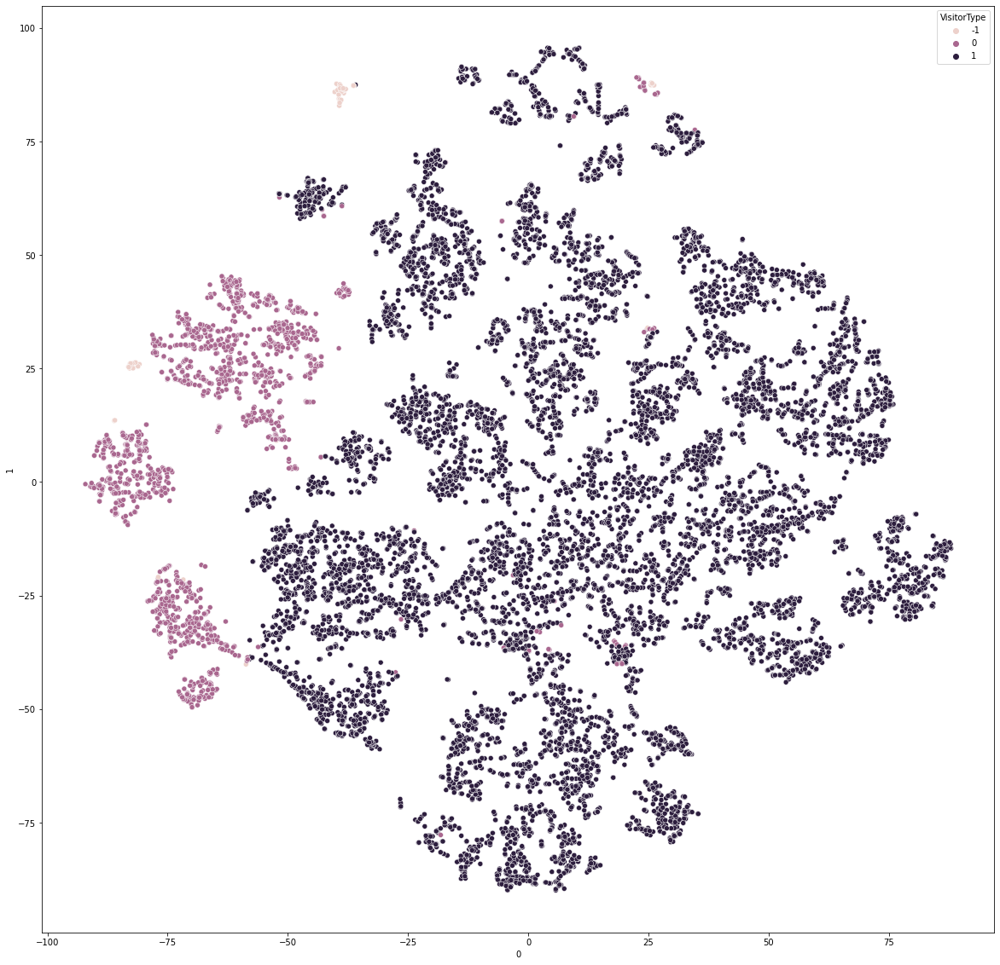

In [21]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_3[0],y=tsne_3[1],hue=df['VisitorType'])

<AxesSubplot:xlabel='0', ylabel='1'>

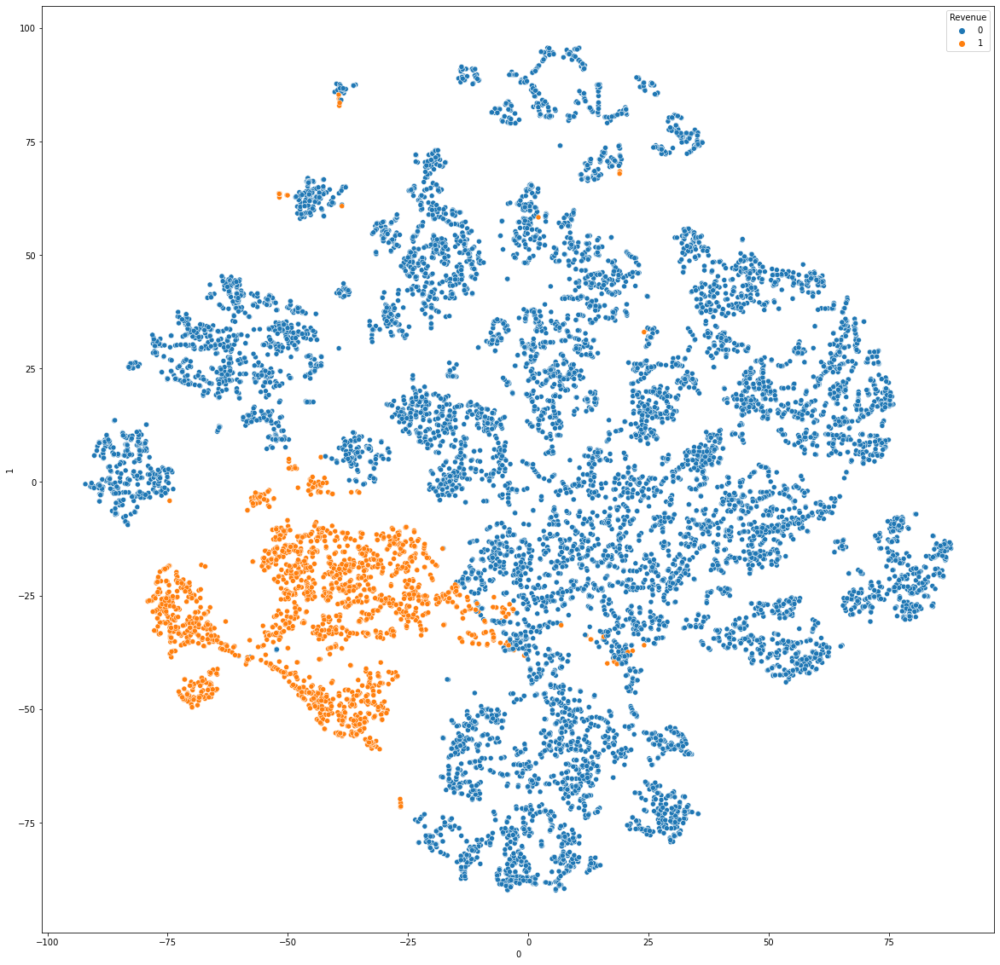

In [22]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_3[0],y=tsne_3[1],hue=df['Revenue'])

<AxesSubplot:xlabel='0', ylabel='1'>

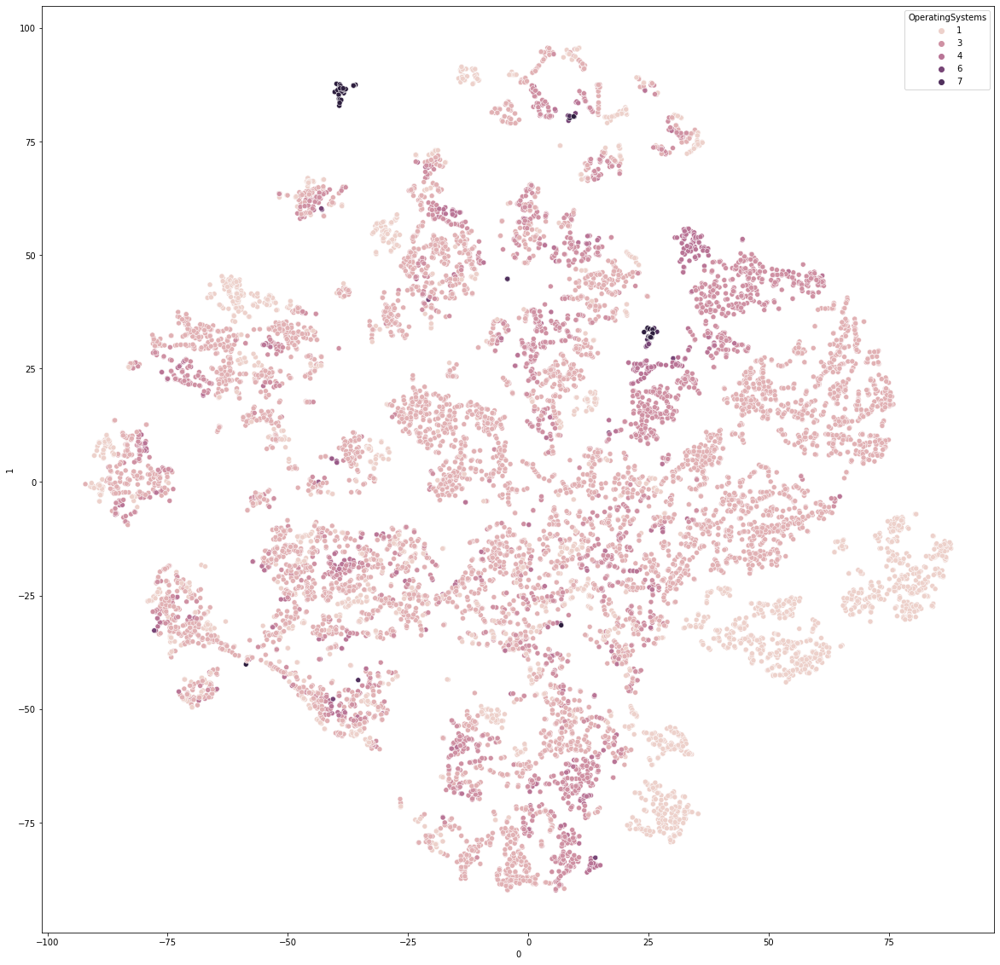

In [23]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_3[0],y=tsne_3[1],hue=df['OperatingSystems'])

<AxesSubplot:xlabel='0', ylabel='1'>

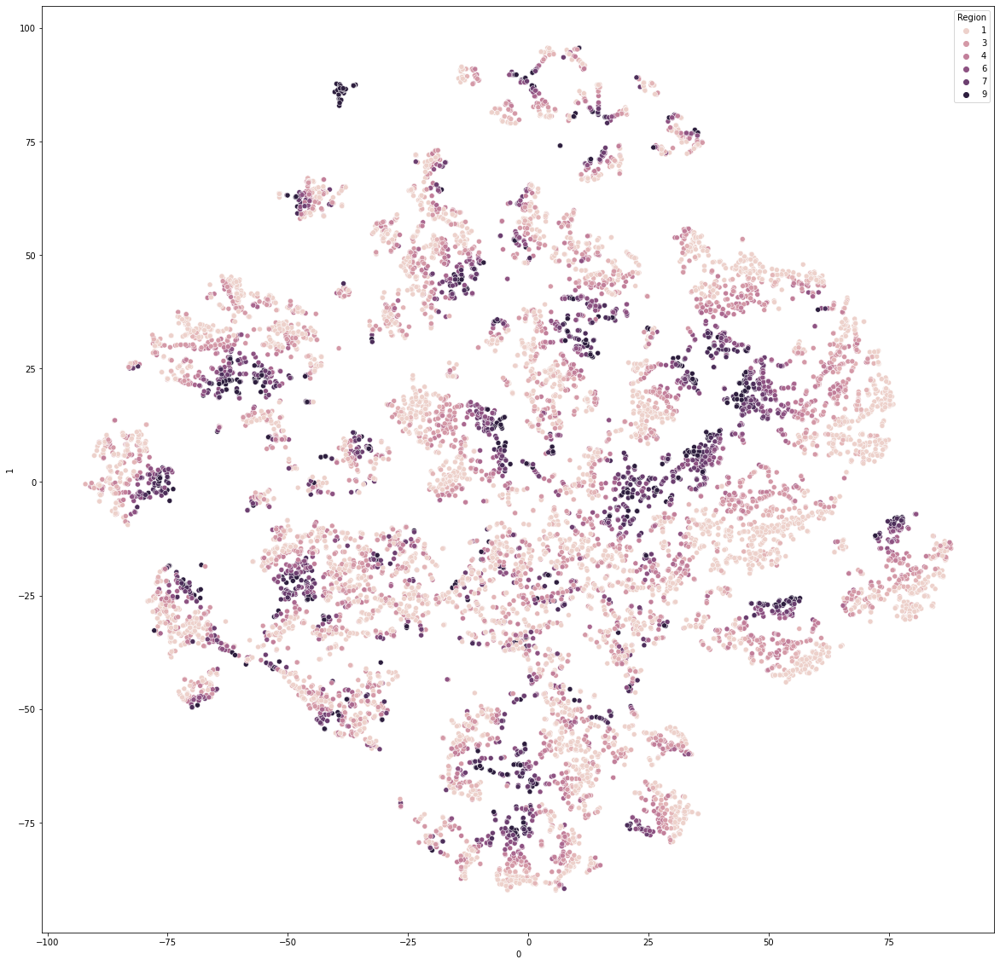

In [24]:
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_3[0],y=tsne_3[1],hue=df['Region'])

### Stability

In [25]:
from sklearn.utils import resample
import math
from sklearn import metrics
def kmeans_stability_mean(df,cluster_num):
    n=100
    ans=[]
    metr=[]
    labels_true=KMeans(n_clusters=cluster_num).fit_predict(df)
    mean=0
    for i in range(n):
        bootstrap=resample(df, replace=True, n_samples=math.floor(df.shape[0]*0.8))
        model=KMeans(n_clusters=cluster_num)
        model.fit(bootstrap)
        ans.append( model.predict(df))
        metr.append(metrics.adjusted_mutual_info_score(labels_true,ans[i]))
        mean+=metr[i]
    mean=mean/n
    return mean

0
1
2
3
4
5
6
7
8
9


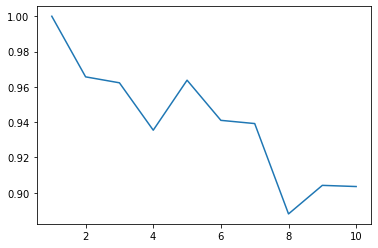

In [85]:
vec=[]
vec1=[]
for i in range(10):
    n_clusters=i+1
    print(i)
    vec.append(kmeans_stability_mean(normalized_df,n_clusters))
    vec1.append(n_clusters)
plt.plot(vec1,vec)
plt.show()

## Klastrowanie 
### Dla skalowanego zbioru

<AxesSubplot:xlabel='0', ylabel='1'>

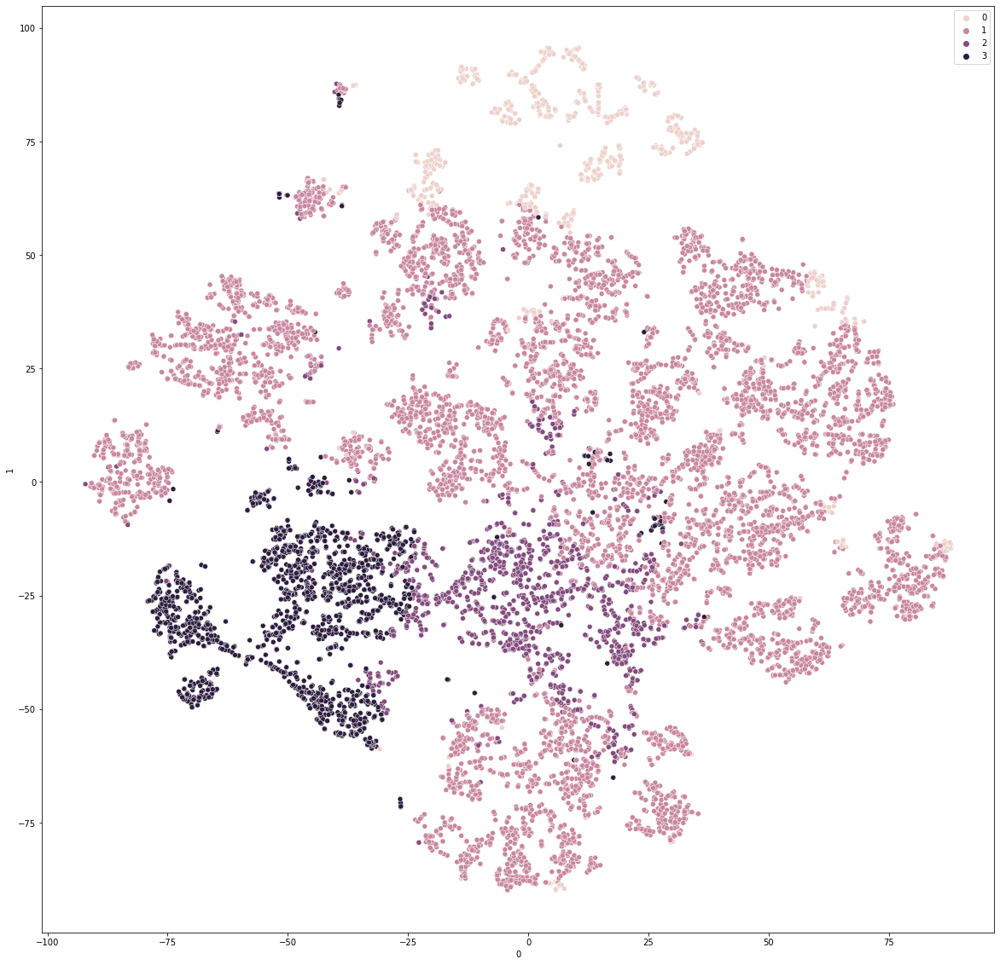

In [86]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df)
plt.figure(figsize=(20,20))
sns.scatterplot(x=tsne_3[0],y=tsne_3[1],hue=kmeans.labels_)

In [70]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)
def draw_silueat_and_klusters(X, tsne, n):
    # Generating the sample data from make_blobs
    # This particular setting has one distinct cluster and 3 clusters placed close
    # together.

    range_n_clusters = range(2,n)

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.4,-0.3,-0.2,-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(x=tsne[0],y=tsne[1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

    plt.show()

Automatically created module for IPython interactive environment


For n_clusters = 2 The average silhouette_score is : 0.25141845791738543
For n_clusters = 3 The average silhouette_score is : 0.23469466697381006
For n_clusters = 4 The average silhouette_score is : 0.2039934277864987
For n_clusters = 5 The average silhouette_score is : 0.17170120330878635
For n_clusters = 6 The average silhouette_score is : 0.11618782159238865
For n_clusters = 7 The average silhouette_score is : 0.12072539063747138
For n_clusters = 8 The average silhouette_score is : 0.15261538395044077
For n_clusters = 9 The average silhouette_score is : 0.15463822290035878


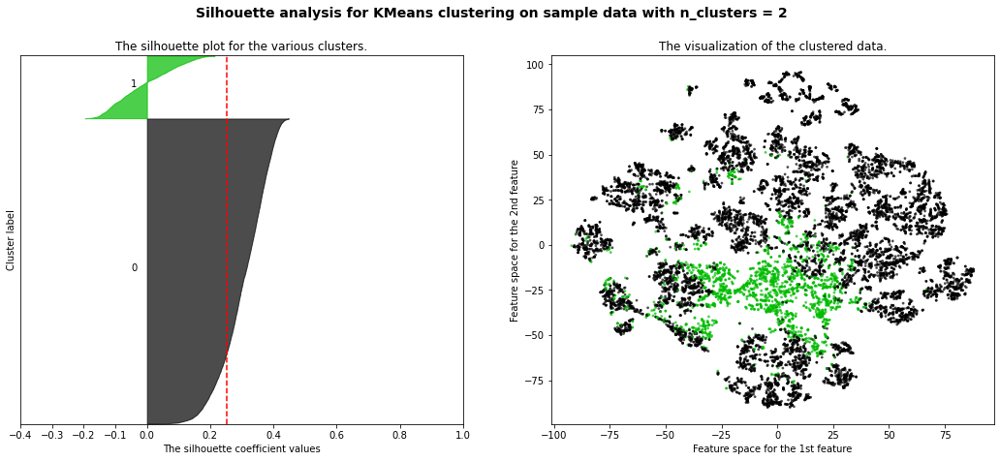

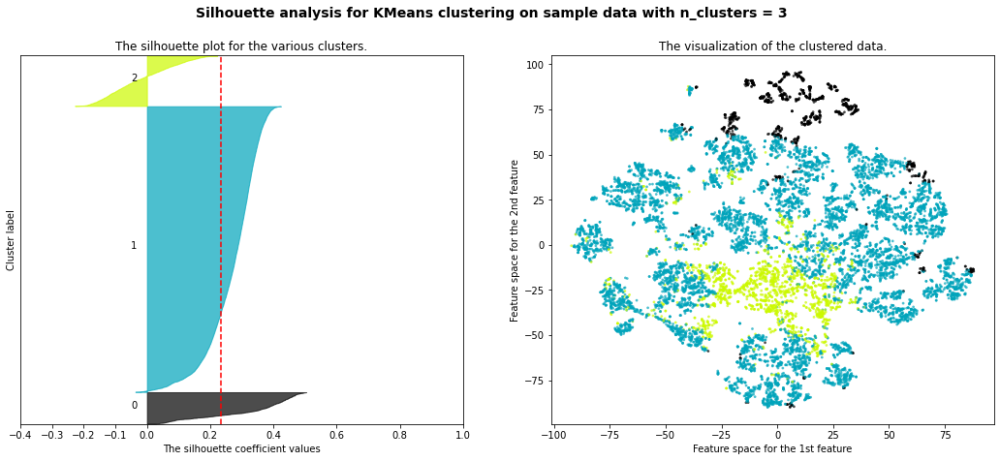

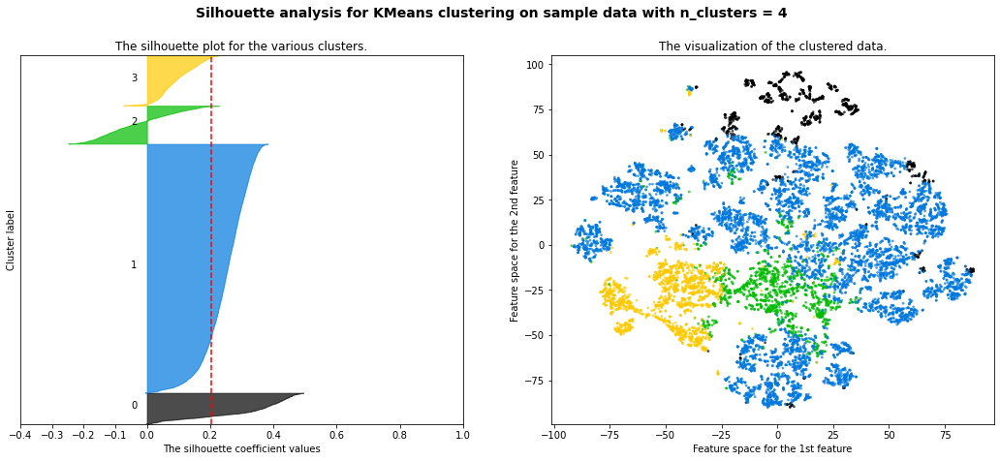

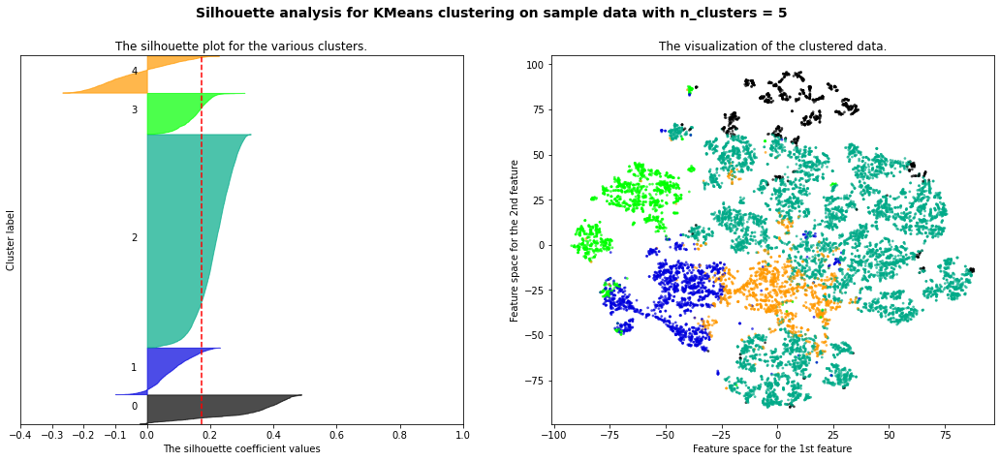

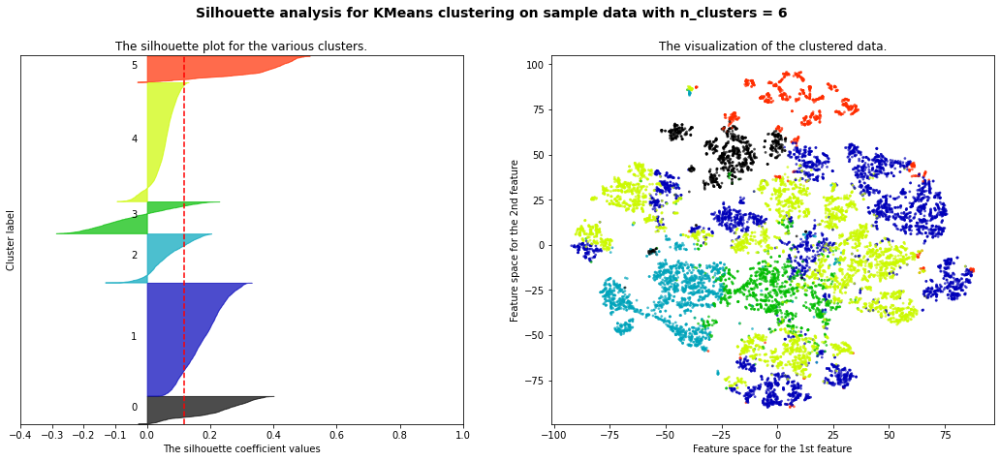

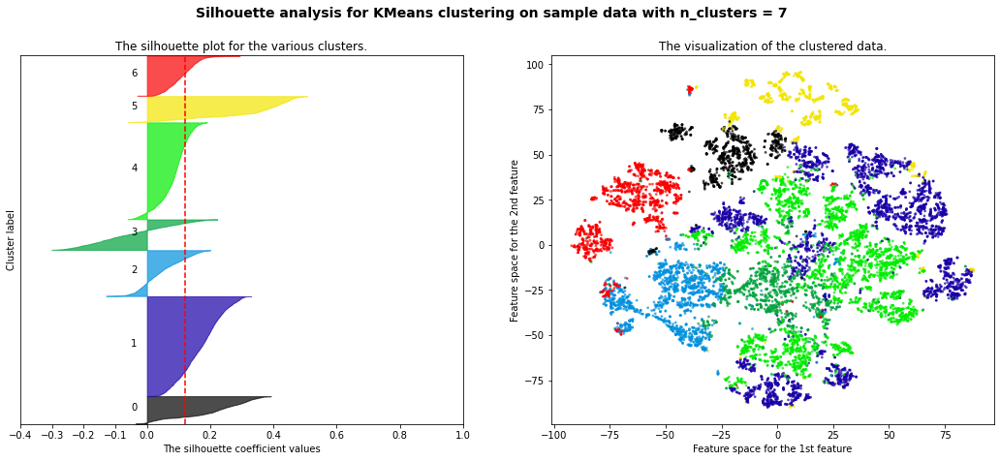

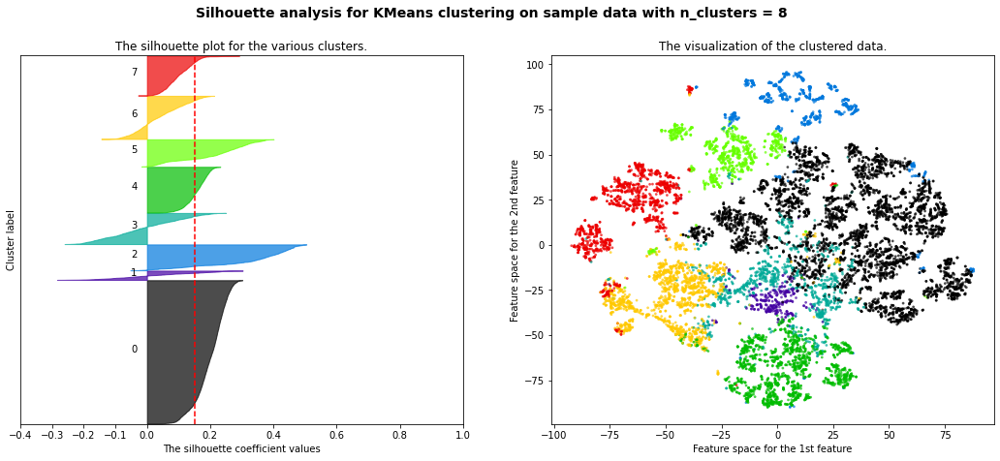

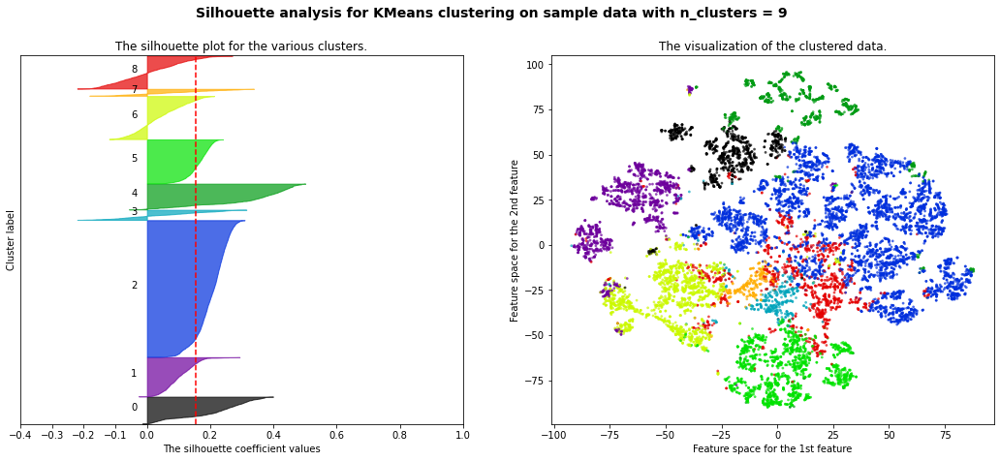

In [81]:
draw_silueat_and_klusters(scaled_df, tsne_3, 10)

### Dla normalizowanych 

For n_clusters = 2 The average silhouette_score is : 0.7839739120797177
For n_clusters = 3 The average silhouette_score is : 0.7185782968370762
For n_clusters = 4 The average silhouette_score is : 0.6046810352761838
For n_clusters = 5 The average silhouette_score is : 0.5995853049541051
For n_clusters = 6 The average silhouette_score is : 0.5860367200267501
For n_clusters = 7 The average silhouette_score is : 0.601464422685778
For n_clusters = 8 The average silhouette_score is : 0.5298943418292775
For n_clusters = 9 The average silhouette_score is : 0.5249428373266452


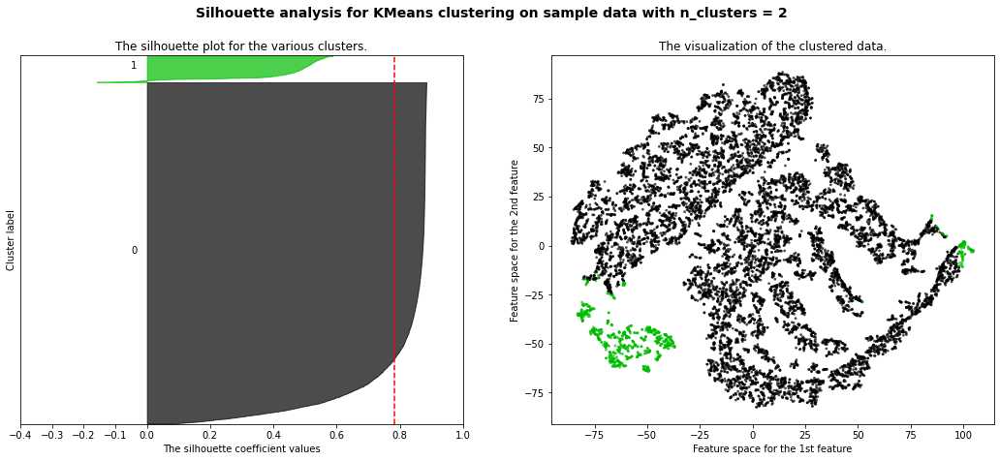

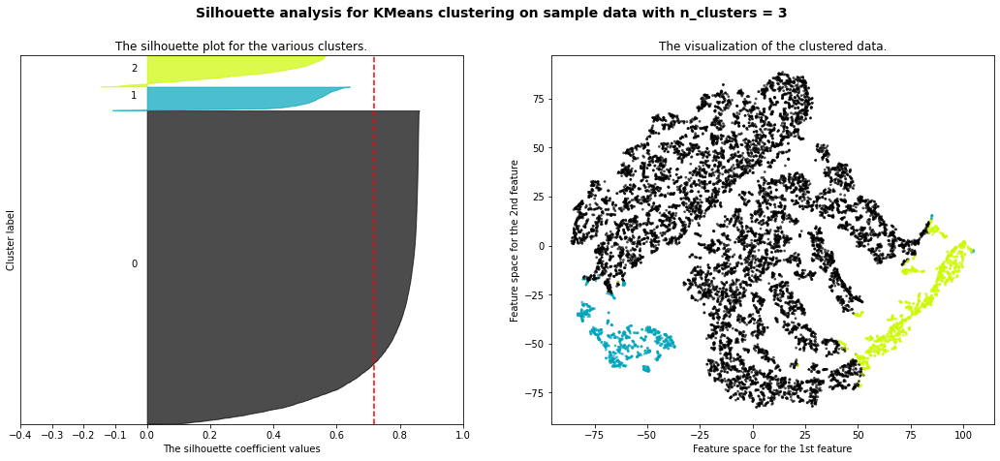

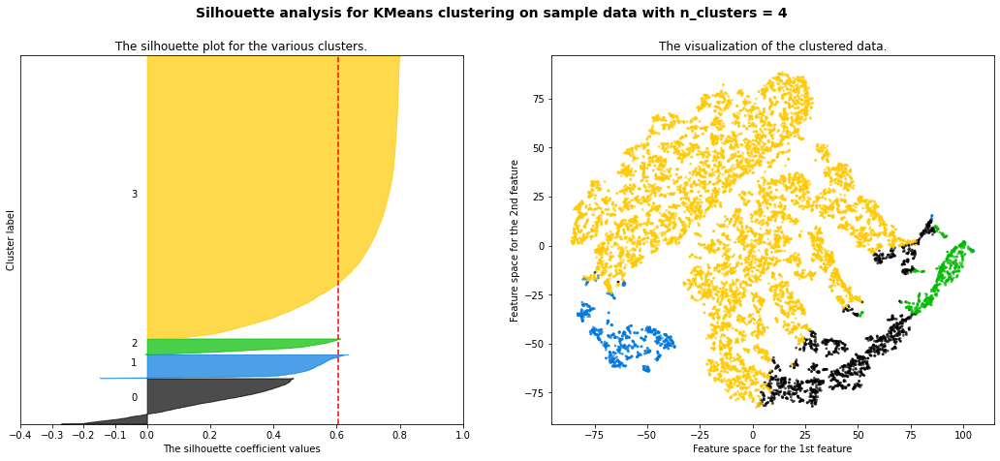

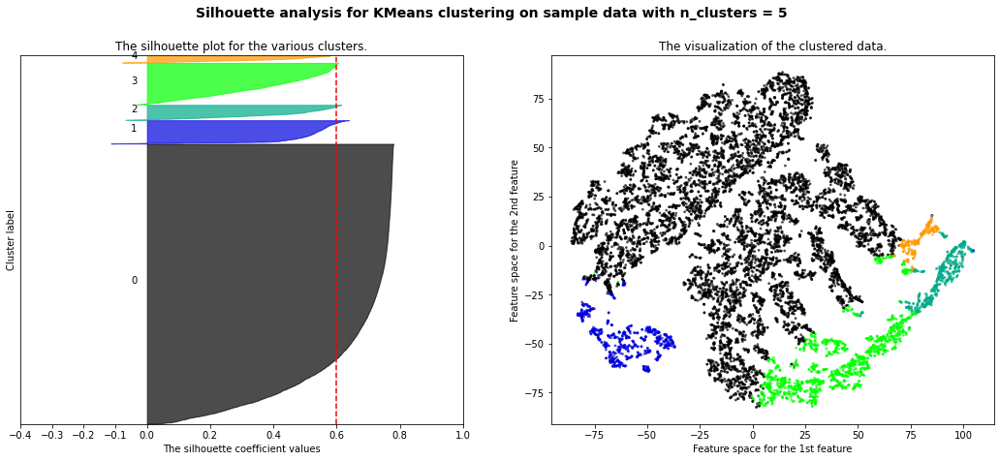

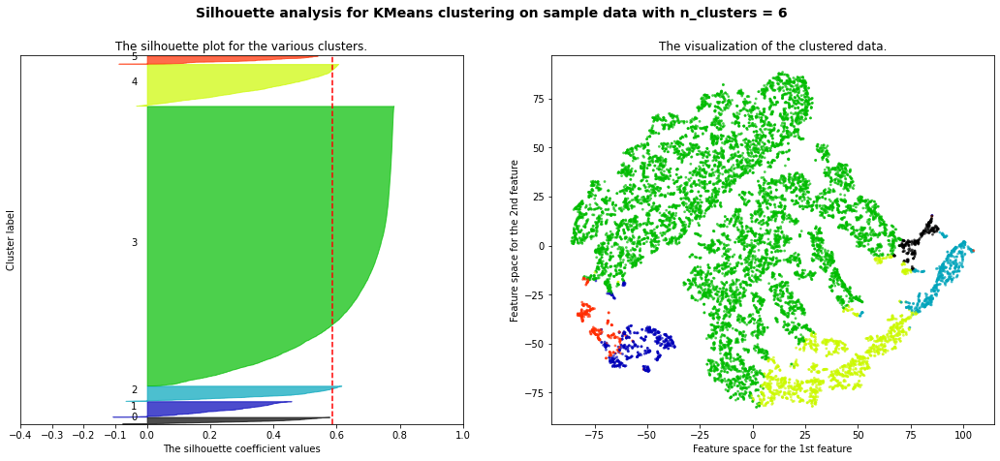

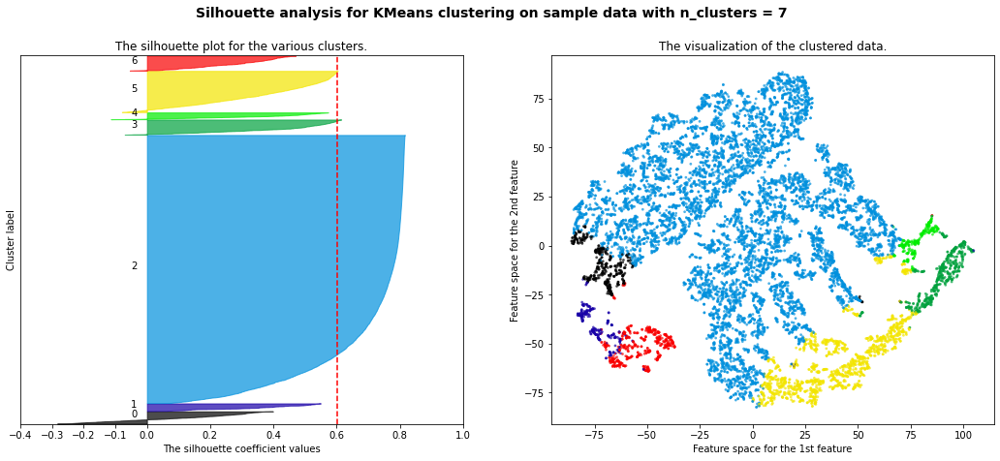

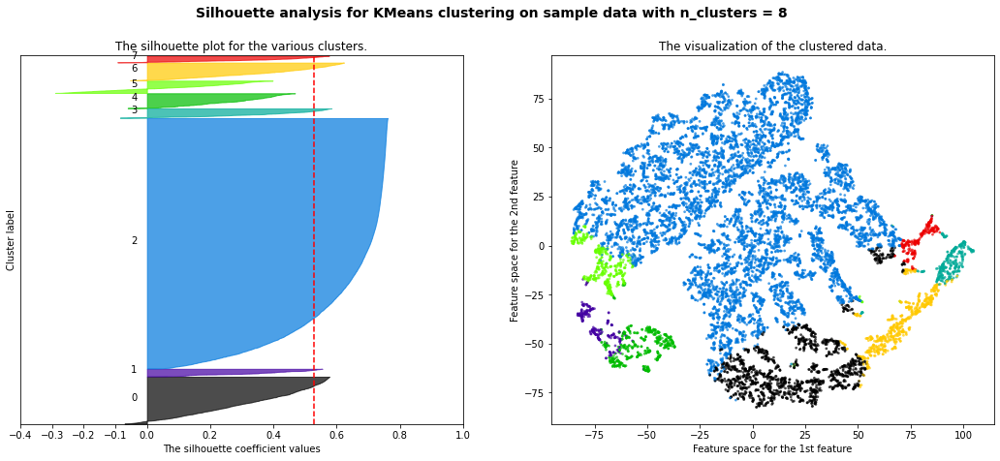

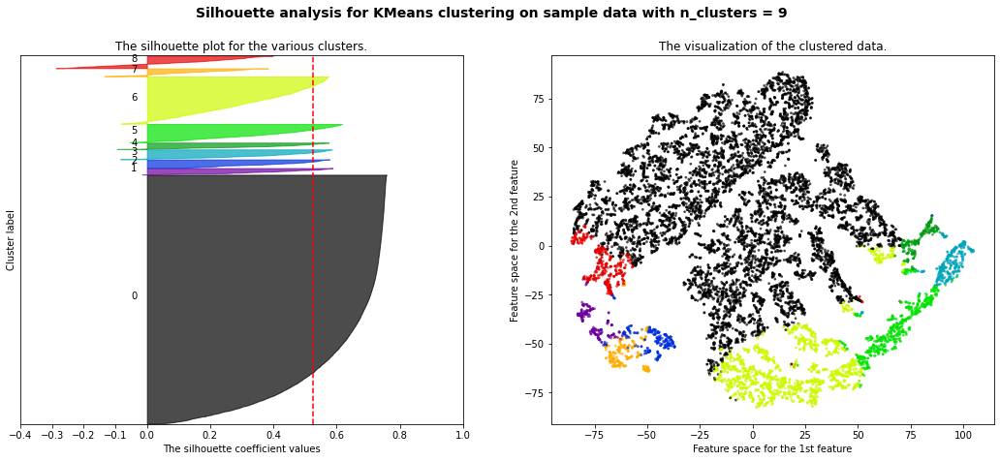

In [82]:
draw_silueat_and_klusters(normalized_df, tsne_2, 10)

### Dla zwykłych 

For n_clusters = 2 The average silhouette_score is : 0.781454107784213
For n_clusters = 3 The average silhouette_score is : 0.6949491848836492
For n_clusters = 4 The average silhouette_score is : 0.6753755308062291
For n_clusters = 5 The average silhouette_score is : 0.622408564822993
For n_clusters = 6 The average silhouette_score is : 0.6054571319271643
For n_clusters = 7 The average silhouette_score is : 0.5903538880634289
For n_clusters = 8 The average silhouette_score is : 0.5654389647296608
For n_clusters = 9 The average silhouette_score is : 0.5461770703941211


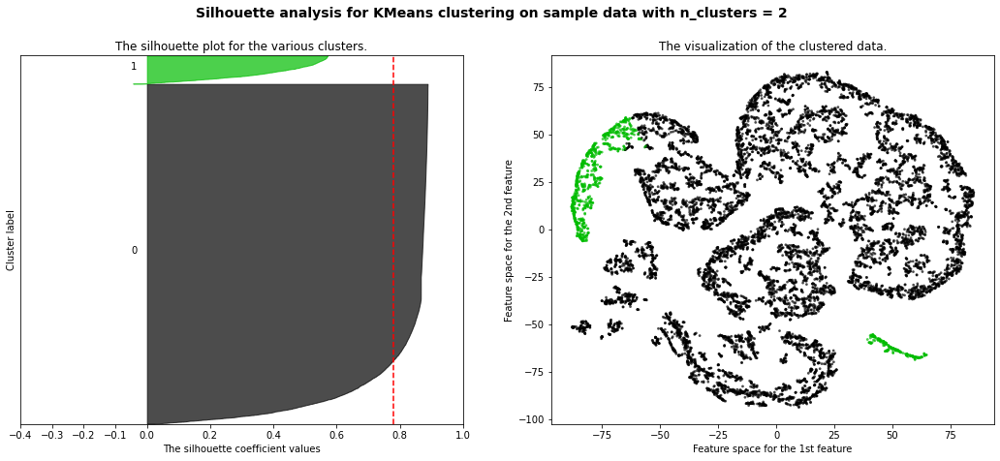

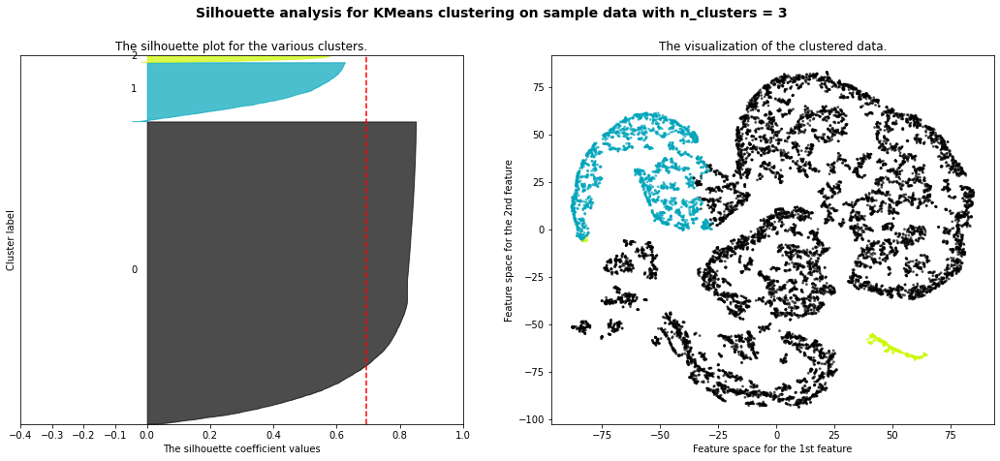

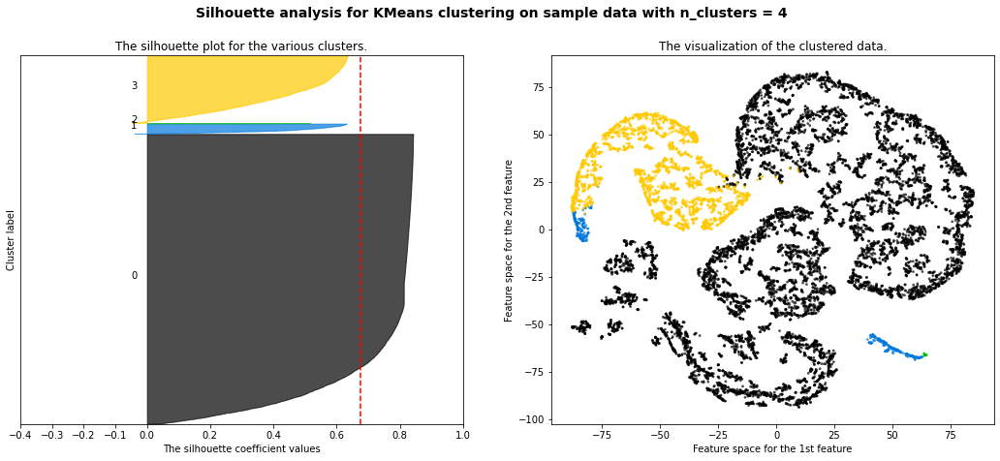

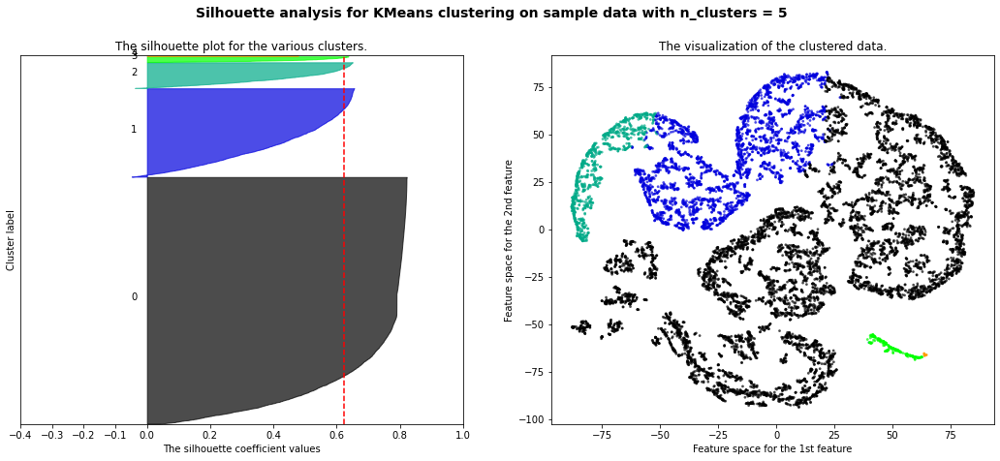

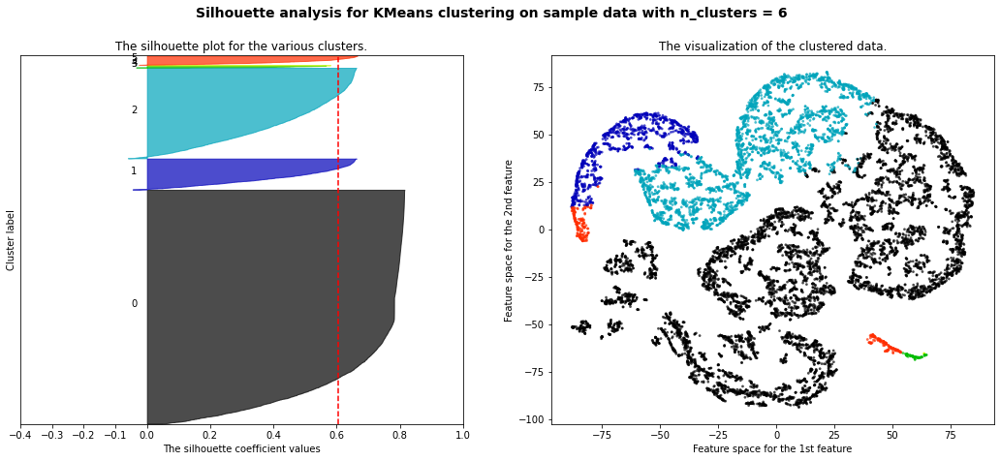

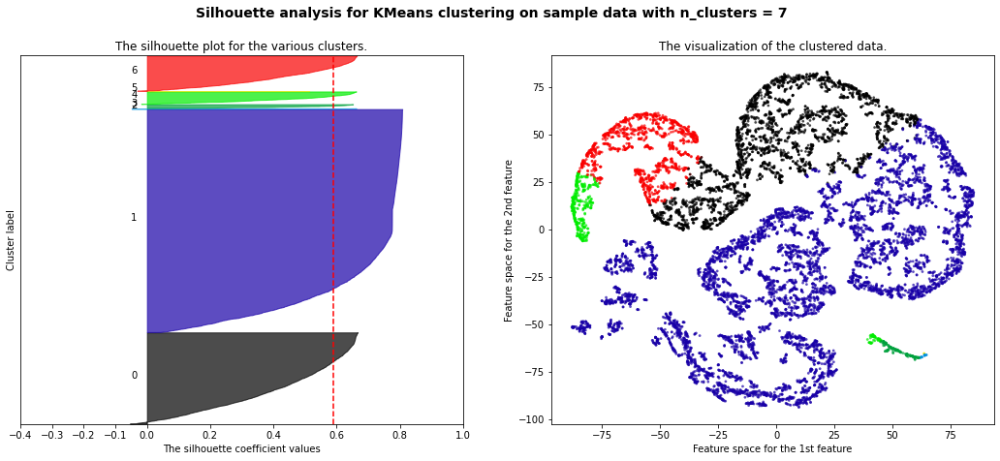

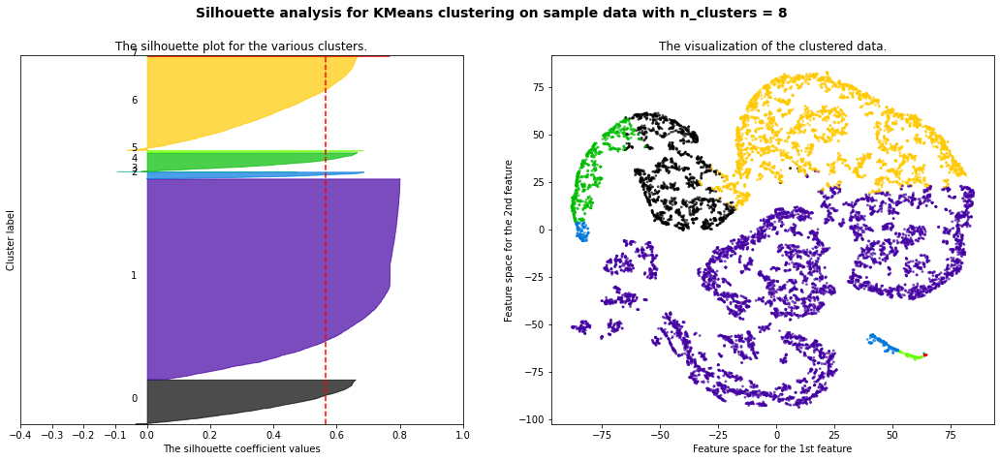

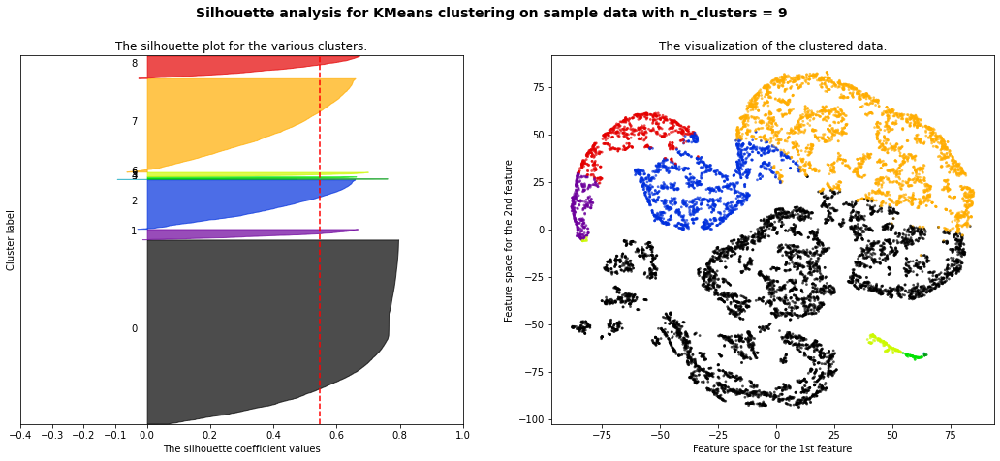

In [83]:
draw_silueat_and_klusters(df, tsne_1, 10)